In [7]:
import pandas as pd
import numpy as np

# running multiple files from a folder path
total_load = 'Total Load Profiles/published_load_data/total_loads/Total_Loads_'
GCAM = ['BAU_Climate_', 'NetZeroNoCCS_Climate_']
years = ['2025', '2035', '2050']

for path in GCAM:
    for year in years:
        file = pd.read_csv(total_load + path + year + '.csv')
        file['Time_UTC'] = pd.to_datetime(file['Time_UTC'])
        
        # manipulating and saving each file
        dataDict = task3(file)
        # upload data into a csv file
        task_data = pd.DataFrame(dataDict)
        task_data.to_csv(path + year + '_3_data.csv', index=False)

Using an array to plot every BA total load data
Using an array to plot every BA total load data
Using an array to plot every BA total load data
Using an array to plot every BA total load data
Using an array to plot every BA total load data
Using an array to plot every BA total load data


In [1]:
# Find the non transportation and total load peak for each BA and evaluate time shift
def task1a(loadDataFile):
    BA_LIST = ['AVA', 'AZPS', 'BANC', 'BPAT', 'CHPD', 'CISO', 'DOPD', 'EPE', 'GCPD', 'IID', 'IPCO', 'LDWP', 'NEVP', 'NWMT', 
               'PACE', 'PACW', 'PGE', 'PNM', 'PSCO', 'PSEI', 'SCL', 'SRP', 'TEPC', 'TIDC', 'TPWR', 'WACM', 'WALC', 'WAUW']
    print("Using an array to plot every BA total load data")
    
    totloadmax = []
    totloaddate = []
    totnontransmax = []
    totnontransdate = []
    timeShift = []
    transloadpercent = []
    
    for ba in BA_LIST:
        # Find max total load and timestamp
        ba_loadDataFile = loadDataFile.loc[loadDataFile['BA'] == ba]

        total_load_max = ba_loadDataFile['Total_Load_MWh'].max()
        total_load_maxpos = ba_loadDataFile['Total_Load_MWh'].idxmax()
        total_load_maxdate = loadDataFile.iloc[total_load_maxpos].loc['Time_UTC']
        totloadmax.append(total_load_max)
        totloaddate.append(total_load_maxdate)

        total_nontrans_max = ba_loadDataFile['Non-Transportation_Load_MWh'].max()
        total_nontrans_maxpos = ba_loadDataFile['Non-Transportation_Load_MWh'].idxmax()
        total_nontrans_maxdate = loadDataFile.iloc[total_nontrans_maxpos].loc['Time_UTC']
        totnontransmax.append(total_nontrans_max)
        totnontransdate.append(total_nontrans_maxdate)

        # if negative, total load shifted to left due to transportation 
        diff = total_load_maxdate - total_nontrans_maxdate
        diff = diff.total_seconds() / 3600
        timeShift.append(diff)
        
        total_trans_load = loadDataFile.iloc[total_load_maxpos].loc['Transportation_Load_MWh']
        transloadpercent.append(total_trans_load / total_load_max)
        
    # turn the data into a dictionary
    totDict = {'BA' : BA_LIST, 
               'Total_Load_Time_UTC' : totloaddate, 
               'Total_Load_MWh' : totloadmax, 
               'Transportation_Load_Penetration_Ratio' : transloadpercent,
               'Non-Transportation_Load_Time_UTC' : totnontransdate,
               'Non-Transportation_Load_MWh' : totnontransmax,
               'Time_Shifting_in_hours' : timeShift}
    return totDict

In [3]:
def task1c(loadDataFile):
    BA_LIST = ['AVA', 'AZPS', 'BANC', 'BPAT', 'CHPD', 'CISO', 'DOPD', 'EPE', 'GCPD', 'IID', 'IPCO', 'LDWP', 'NEVP', 'NWMT',
               'PACE', 'PACW', 'PGE', 'PNM', 'PSCO', 'PSEI', 'SCL', 'SRP', 'TEPC', 'TIDC', 'TPWR', 'WACM', 'WALC', 'WAUW']
    print("Using an array to plot every BA total load data")
    
    # determine average daily use for a BA for projected year
    # (regardless of season or month)
    BA = []
    hour = []
    avg_total = []
    avg_trans = []
    avg_nontrans = []

    for ba in BA_LIST:
        badata = loadDataFile.loc[loadDataFile['BA'] == ba]
        for i in range (0,24): # hour 0 to hour 23
            BA.append(ba)
            hour.append(i)
            hourly = badata.loc[(badata['Time_UTC'].dt.hour==i)]
            average = hourly['Total_Load_MWh'].sum() / len(hourly)
            avg_total.append(average)
            average = hourly['Transportation_Load_MWh'].sum() / len(hourly)
            avg_trans.append(average)
            average = hourly['Non-Transportation_Load_MWh'].sum() / len(hourly)
            avg_nontrans.append(average)

    totDict = {'BA' : BA,
               'Hour' : hour,
               'Total_Load_MWh' : avg_total,
               'Transportation_Load_MWh' : avg_trans, 
               'Non-Transportation_Load_MWh' : avg_nontrans} 
    
    return totDict

In [6]:
def task3(loadDataFile):
    BA_LIST = ['AVA', 'AZPS', 'BANC', 'BPAT', 'CHPD', 'CISO', 'DOPD', 'EPE', 'GCPD', 'IID', 'IPCO', 'LDWP', 'NEVP', 'NWMT', 
               'PACE', 'PACW', 'PGE', 'PNM', 'PSCO', 'PSEI', 'SCL', 'SRP', 'TEPC', 'TIDC', 'TPWR', 'WACM', 'WALC', 'WAUW']
    print("Using an array to plot every BA total load data")
    
    # determine average daily use for a BA for each projected month
    BA = []
    month = []
    hour = []
    avg_total = []
    avg_trans = []
    avg_nontrans = []
    
    for ba in BA_LIST:
        badata = loadDataFile.loc[loadDataFile['BA'] == ba]
        for x in range (1,13): # month Jan(1) to Dec(12)
            badata_month = badata.loc[(badata['Time_UTC'].dt.month == x)]
            for i in range (0,24): # hour 0 to hour 23
                BA.append(ba)
                month.append(x)
                hour.append(i)
                hourly = badata_month.loc[(badata_month['Time_UTC'].dt.hour==i)]
                average = hourly['Total_Load_MWh'].sum() / len(hourly)
                avg_total.append(average)
                average = hourly['Transportation_Load_MWh'].sum() / len(hourly)
                avg_trans.append(average)
                average = hourly['Non-Transportation_Load_MWh'].sum() / len(hourly)
                avg_nontrans.append(average)

    totDict = {'BA' : BA,
               'Month' : month,
               'Hour' : hour,
               'Total_Load_MWh' : avg_total,
               'Transportation_Load_MWh' : avg_trans, 
               'Non-Transportation_Load_MWh' : avg_nontrans} 
    
    return totDict

Using an array to plot every BA total load data


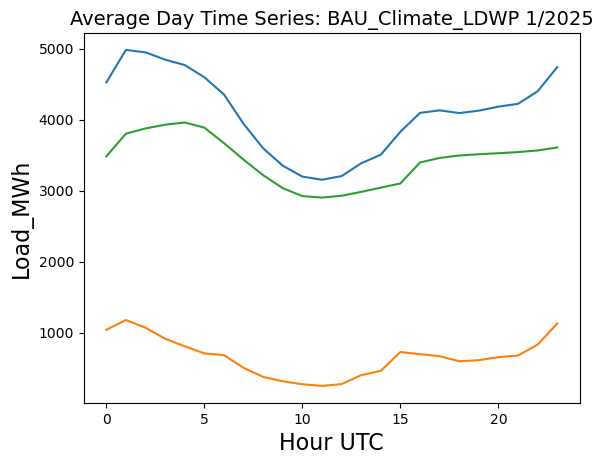

Using an array to plot every BA total load data


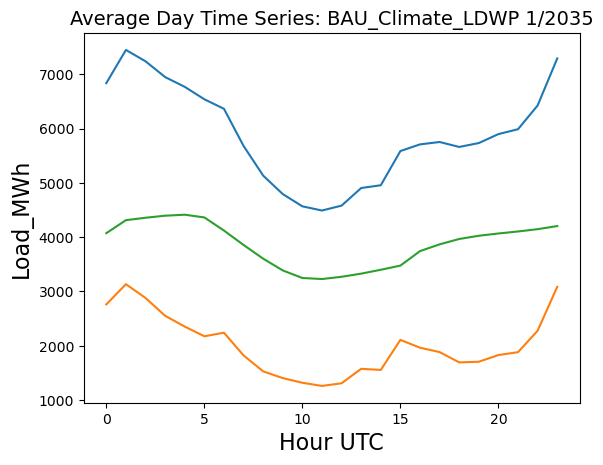

Using an array to plot every BA total load data


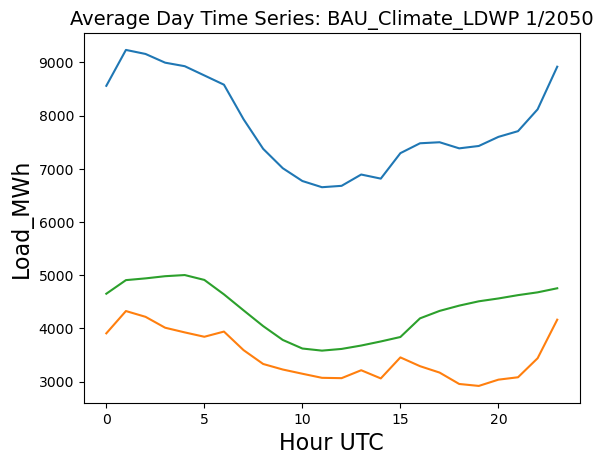

Using an array to plot every BA total load data


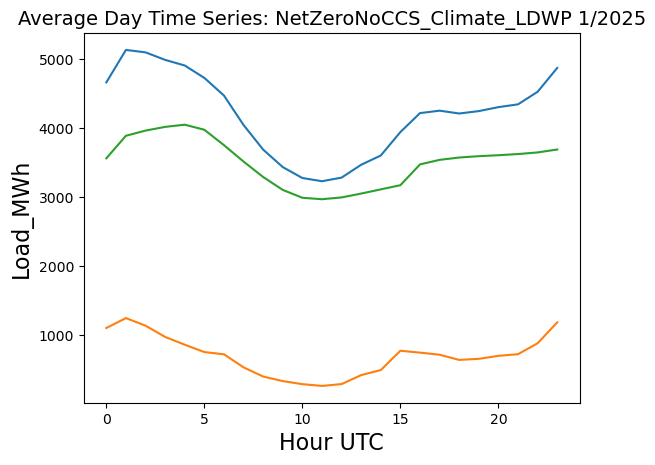

Using an array to plot every BA total load data


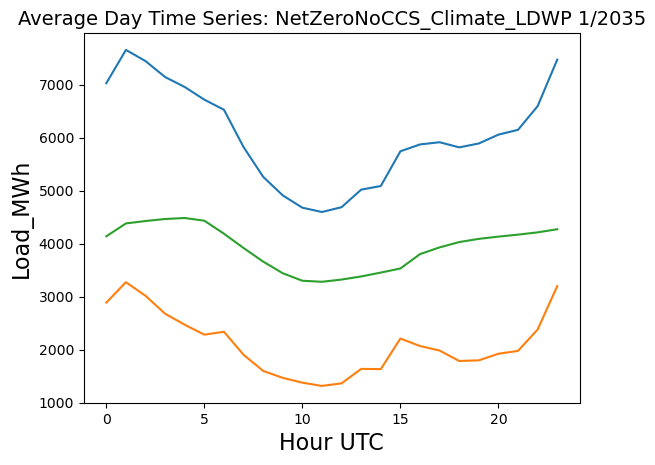

Using an array to plot every BA total load data


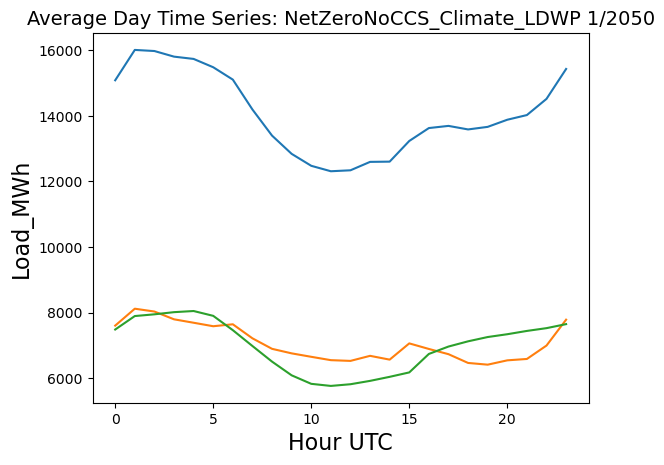

In [11]:
# Plot from Task data
import pandas as pd
import numpy as np
import os # if I have time
import matplotlib.pyplot as plt

# running multiple files from a folder path
folder = 'Task 3/'
GCAM = ['BAU_Climate_', 'NetZeroNoCCS_Climate_']
years = ['2025', '2035', '2050']
task = '_3'

for path in GCAM:
    for year in years:
        file = pd.read_csv(folder + path + year + task + '_data.csv')
        # file = pd.read_csv('Task 3/BAU_Climate_2025_3_data.csv')
        # file['Time_UTC'] = pd.to_datetime(file['Time_UTC'])
        BA_LIST = ['AVA', 'AZPS', 'BANC', 'BPAT', 'CHPD', 'CISO', 'DOPD', 'EPE', 'GCPD', 'IID', 'IPCO', 'LDWP', 'NEVP', 'NWMT', 
                   'PACE', 'PACW', 'PGE', 'PNM', 'PSCO', 'PSEI', 'SCL', 'SRP', 'TEPC', 'TIDC', 'TPWR', 'WACM', 'WALC', 'WAUW']
        UTC_LIST = ['', '', '', '', '', '', '']
        print("Using an array to plot every BA total load data")
        
        #for ba in BA_LIST:
            #badata = file.loc[file['BA'] == ba]
        ba = 'PACW'
        badata = file.loc[file['BA'] == ba]
        for x in range(1, 2):
            monthly = badata.loc[badata['Month'] == x]
            fig = plt.figure()
            plt.plot(monthly['Hour'], monthly['Total_Load_MWh'], label='Total_Load_MWh')
            plt.plot(monthly['Hour'], monthly['Transportation_Load_MWh'], label='Transportation_Load_MWh')
            plt.plot(monthly['Hour'], monthly['Non-Transportation_Load_MWh'], label='Non-Transportation_Load_MWh')
            plt.ylabel('Load_MWh', fontsize=16)
            plt.xlabel('Hour UTC', fontsize=16)
            plt.title('Average Day Time Series: ' + path + ba + ' ' + str(x) + '/' + year, fontsize=14)
            #plt.legend(loc='center right')
            plt.savefig(path + ba + '_' + year + '_month_' + str(x) + '.png')
            plt.show() 
            # pick specific BAs to showcase remember to indicate time

In [23]:
# Plot from Task data
import pandas as pd
import numpy as np
import os # if I have time
import matplotlib.pyplot as plt

# running multiple files from a folder path
folder = 'Task 3/'
GCAM = ['BAU_Climate_', 'NetZeroNoCCS_Climate_']
years = ['2025', '2035', '2050']
task = '_3'

for path in GCAM:
    for year in years:
        file = pd.read_csv(folder + path + year + task + '_data.csv')
        # file = pd.read_csv('Task 3/BAU_Climate_2025_3_data.csv')
        # file['Time_UTC'] = pd.to_datetime(file['Time_UTC'])
        BA_LIST = ['AVA', 'AZPS', 'BANC', 'BPAT', 'CHPD', 'CISO', 'DOPD', 'EPE', 'GCPD', 'IID', 'IPCO', 'LDWP', 'NEVP', 'NWMT', 
                   'PACE', 'PACW', 'PGE', 'PNM', 'PSCO', 'PSEI', 'SCL', 'SRP', 'TEPC', 'TIDC', 'TPWR', 'WACM', 'WALC', 'WAUW']
        print("Using an array to plot every BA total load data")
        
        BA = []
        hour = []
        avg_ratio = []
        
        for ba in BA_LIST:
            badata = file.loc[file['BA'] == ba]
            hours = 0
            for y in range(1, 13) :
                monthly = badata.loc[badata['Month'] == y]
                for z in range(0, 24):
                    hourly = monthly.loc[monthly['Hour'] == z]
                    BA.append(ba)
                    hour.append(hours)
                    hours = hours + 1
                    ratio = (float(hourly['Transportation_Load_MWh']) * 100) / float(hourly['Total_Load_MWh'])
                    avg_ratio.append(round(ratio, 2))
                
        totDict = {'BA' : BA,
                   'Hour' : hour,
                   'Transportation_Load_Penetration_Percentage' : avg_ratio}
        
        task_data = pd.DataFrame(totDict)
        task_data
        task_data.to_csv(path + year + '_3.7_data.csv', index=False)

Using an array to plot every BA total load data
Using an array to plot every BA total load data
Using an array to plot every BA total load data
Using an array to plot every BA total load data
Using an array to plot every BA total load data
Using an array to plot every BA total load data


Using an array to plot every BA total load data


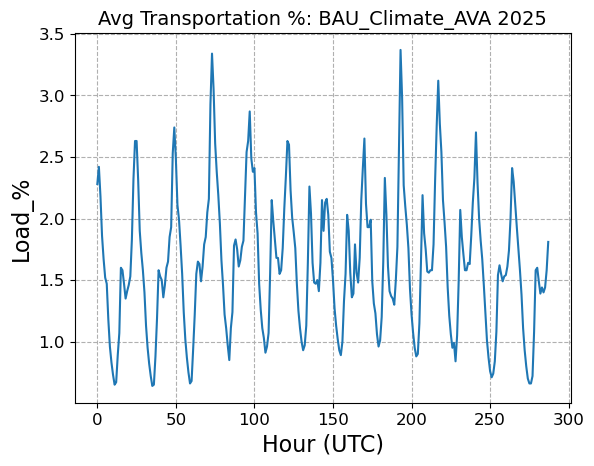

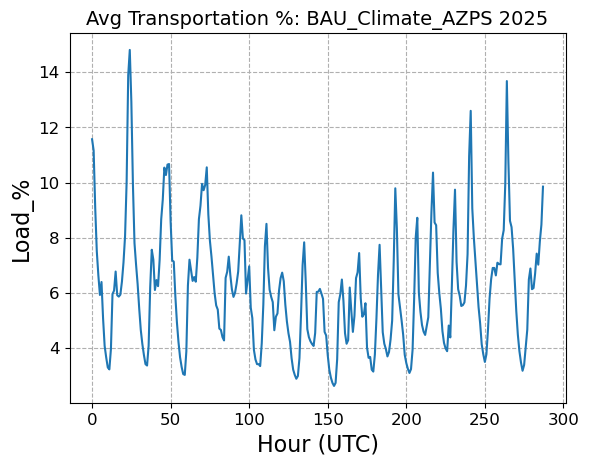

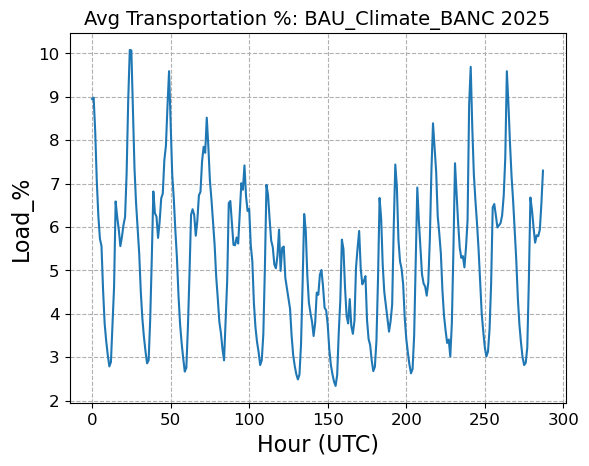

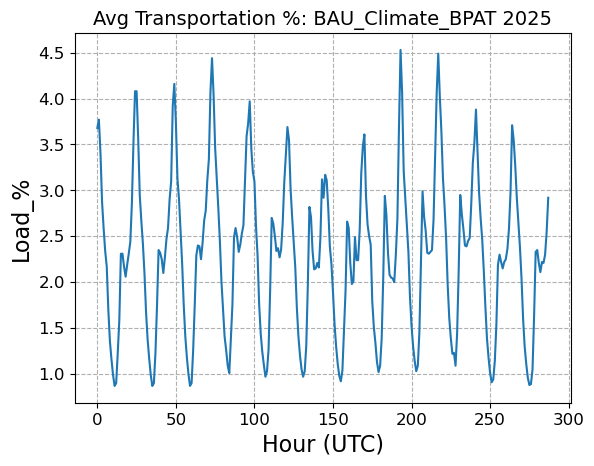

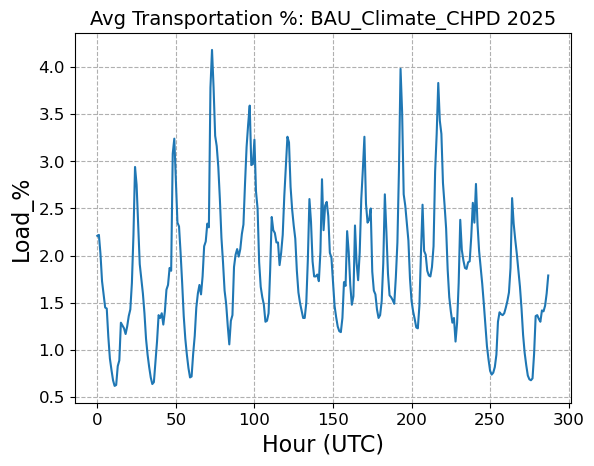

...

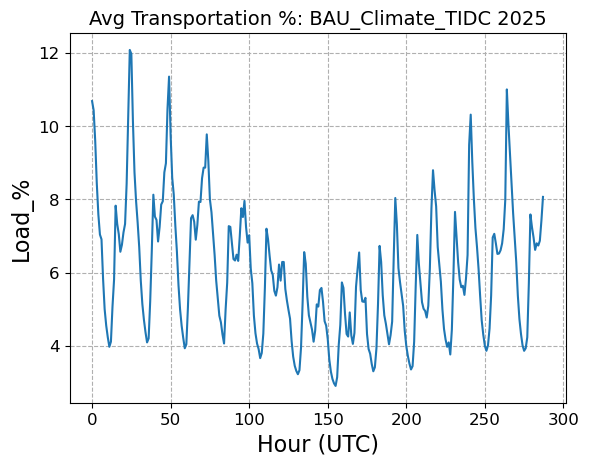

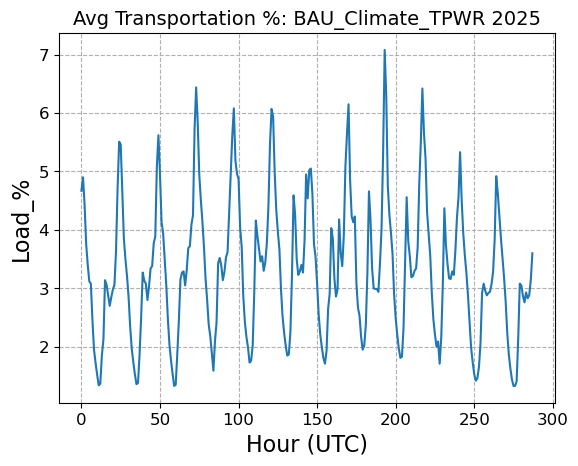

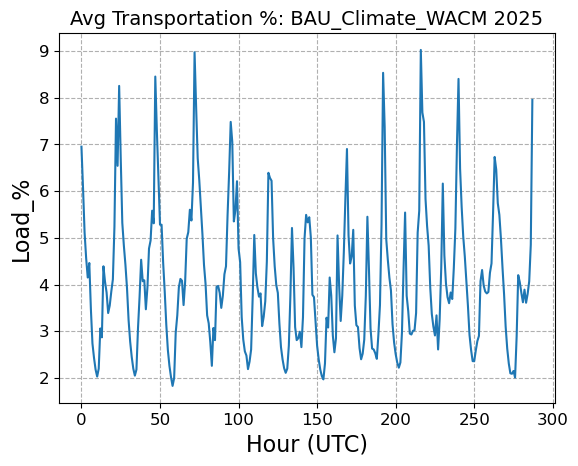

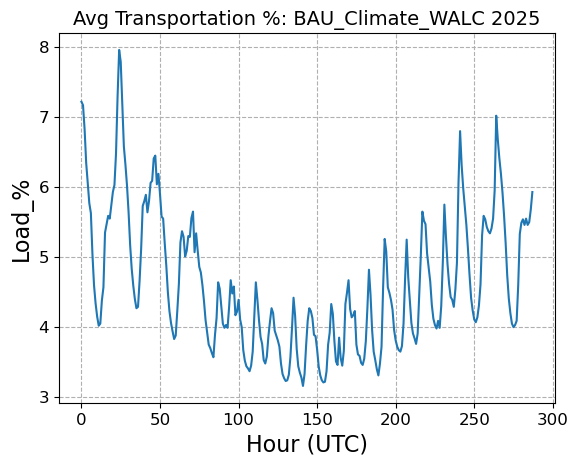

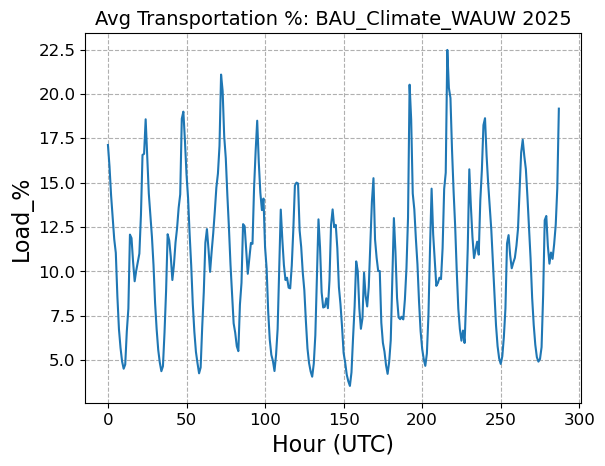

Using an array to plot every BA total load data


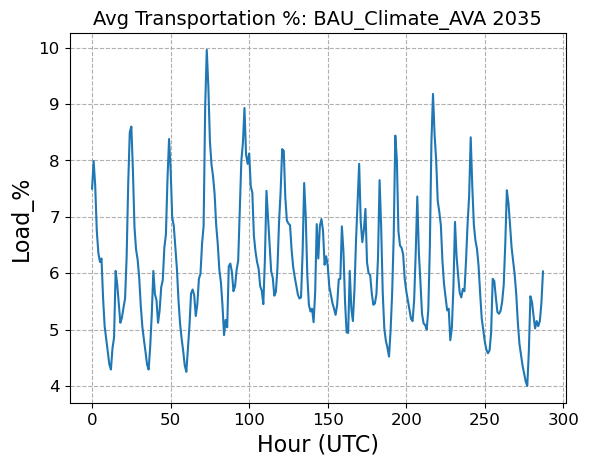

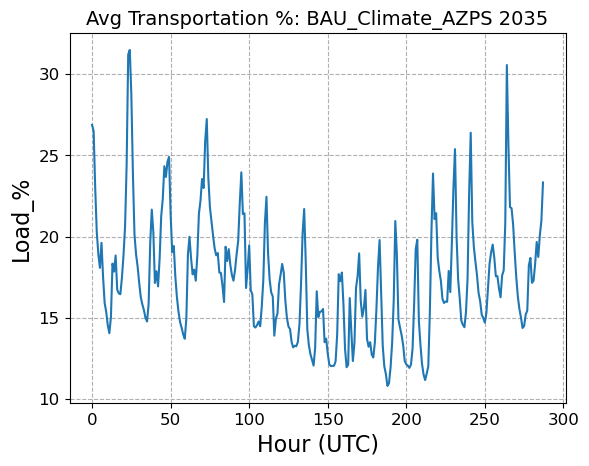

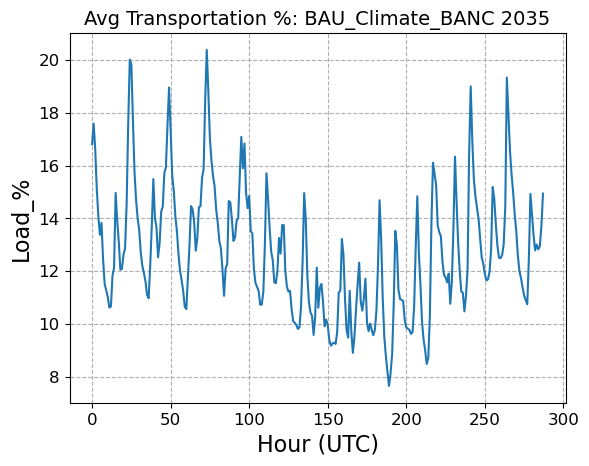

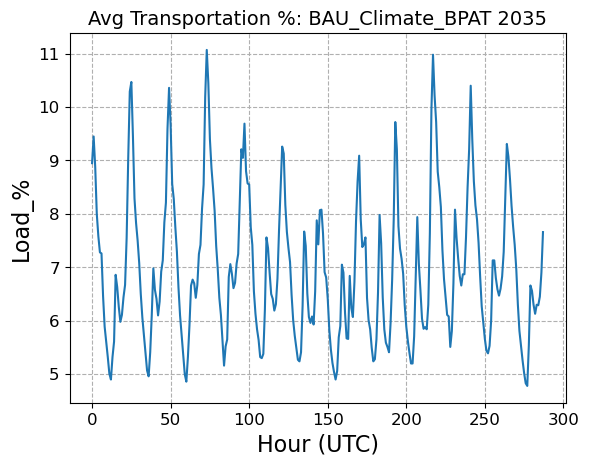

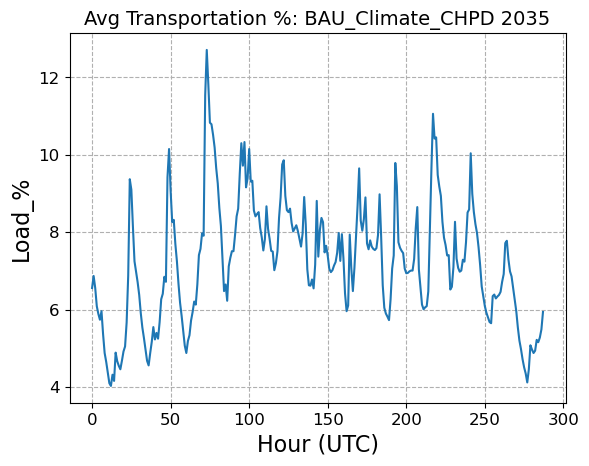

...

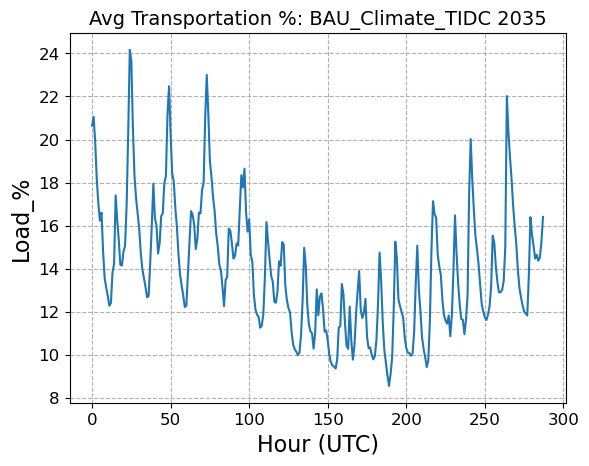

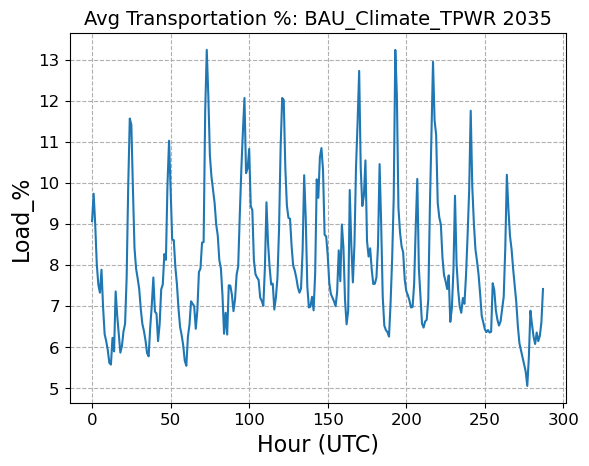

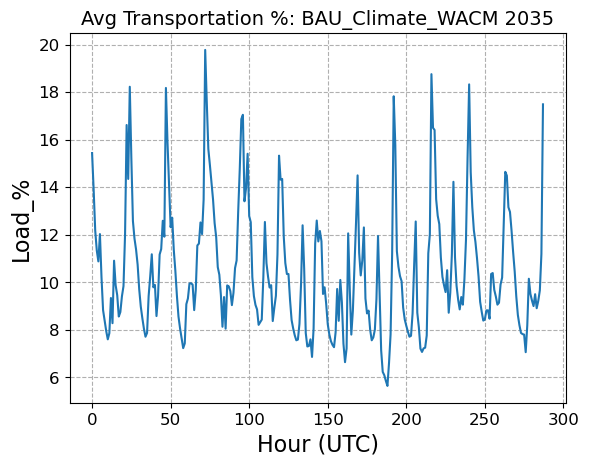

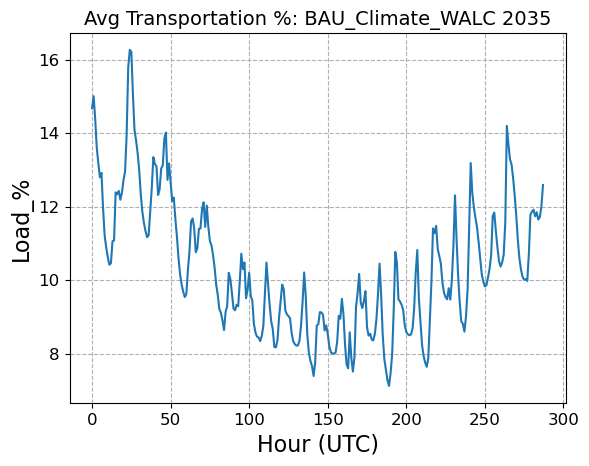

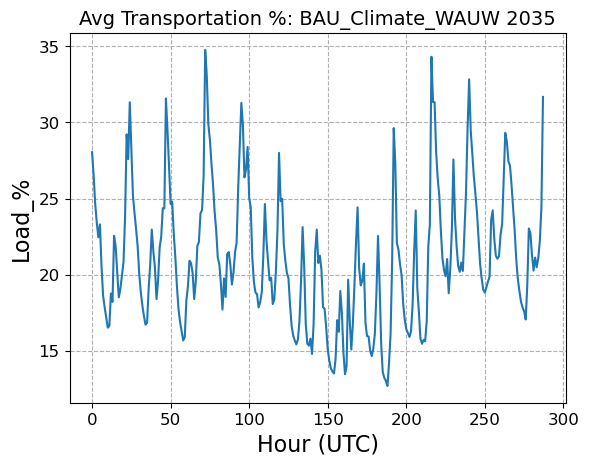

Using an array to plot every BA total load data


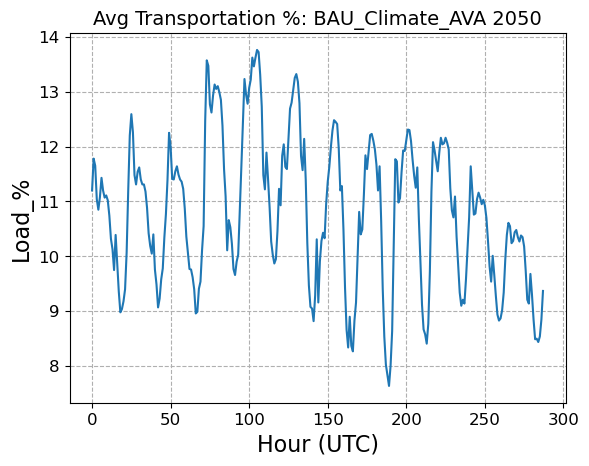

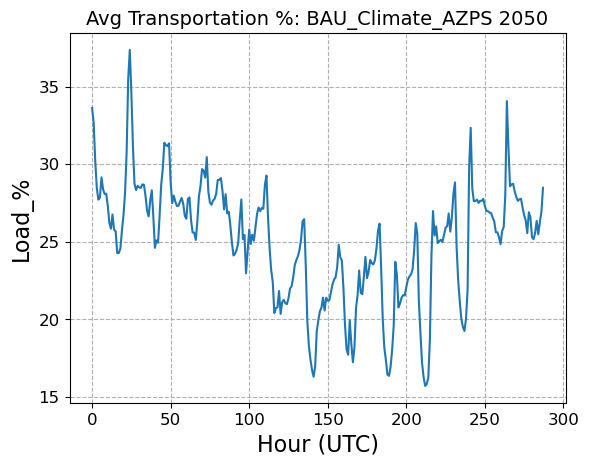

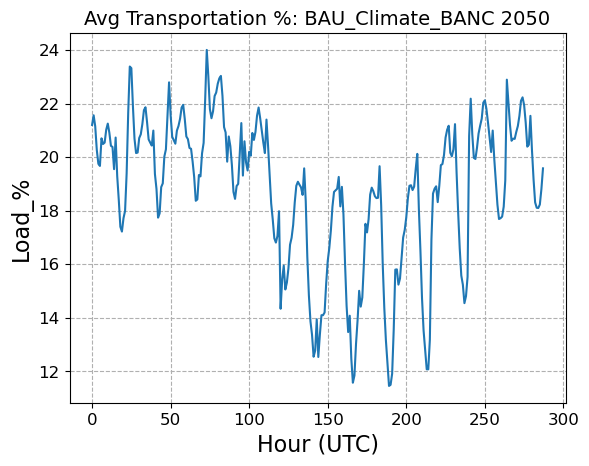

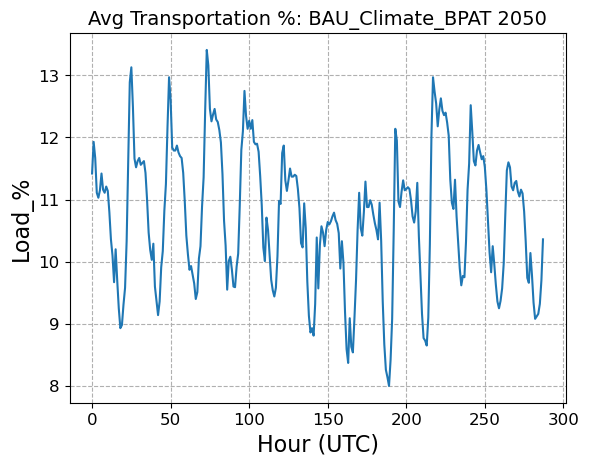

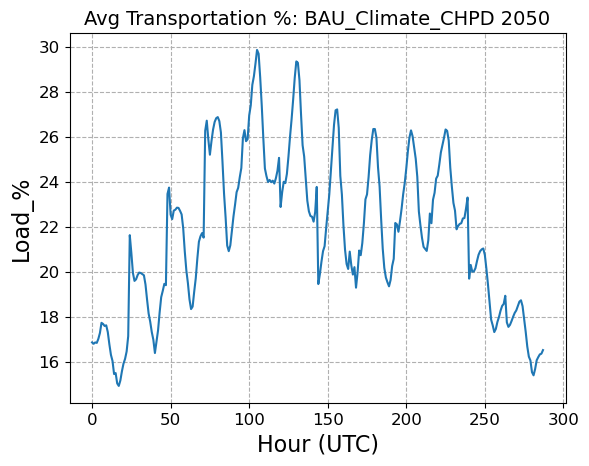

...

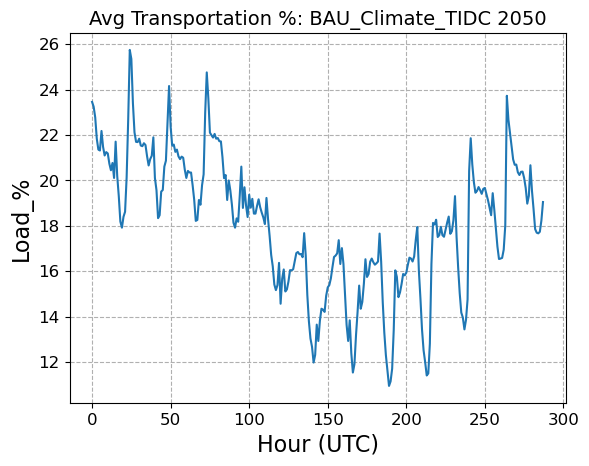

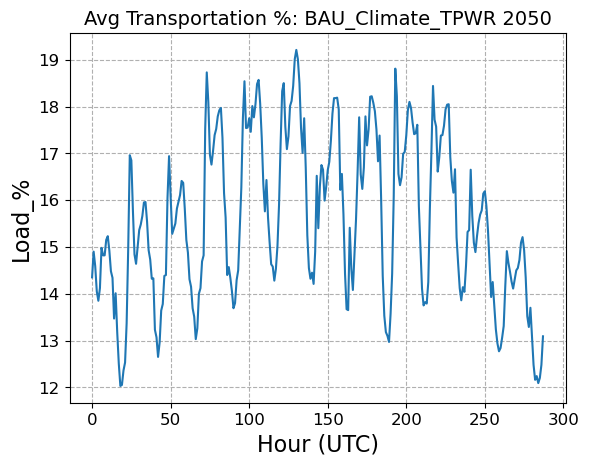

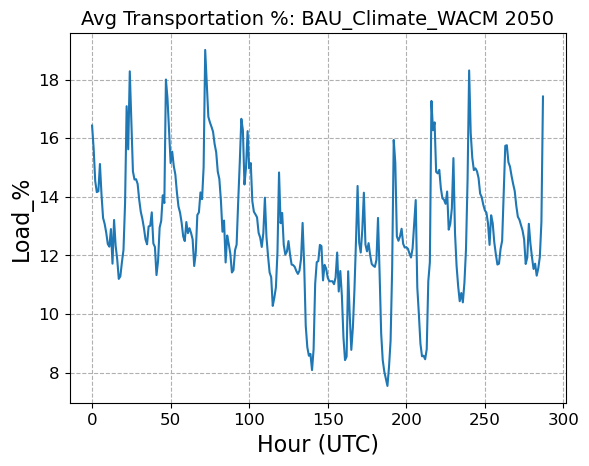

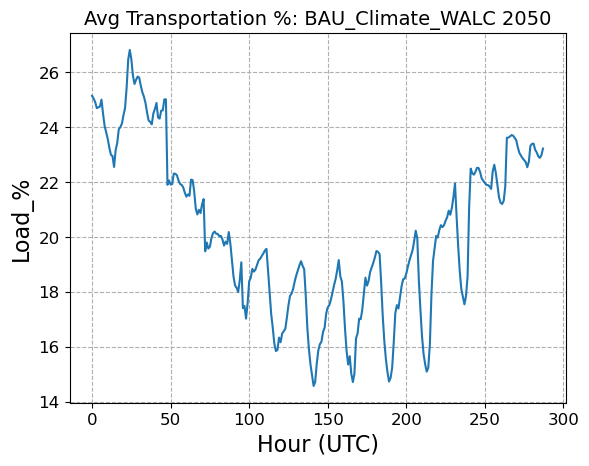

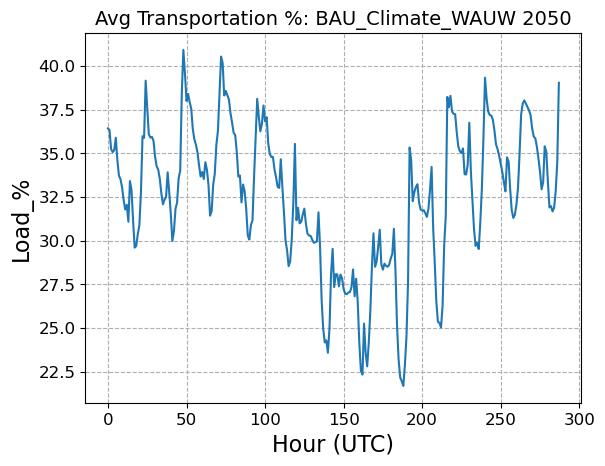

Using an array to plot every BA total load data


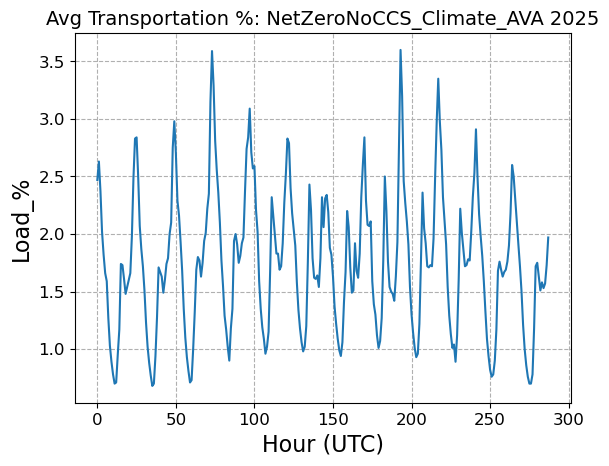

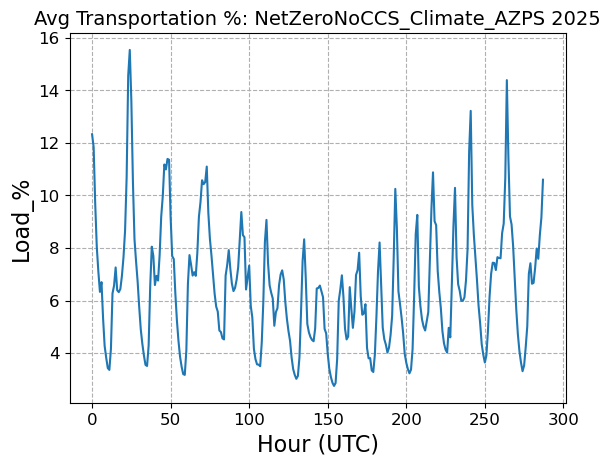

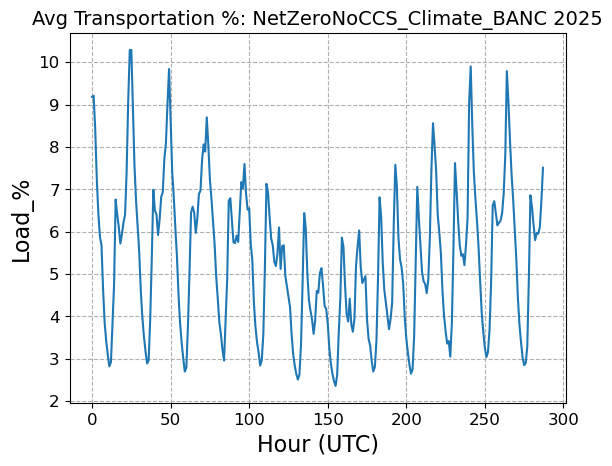

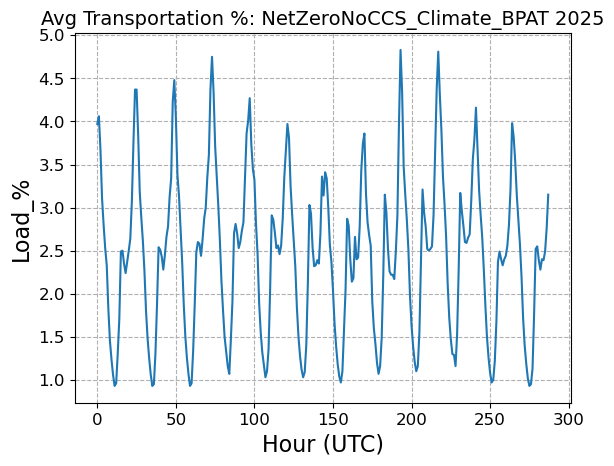

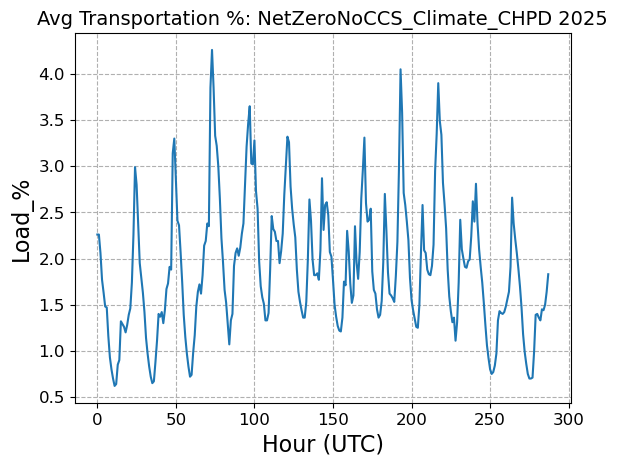

...

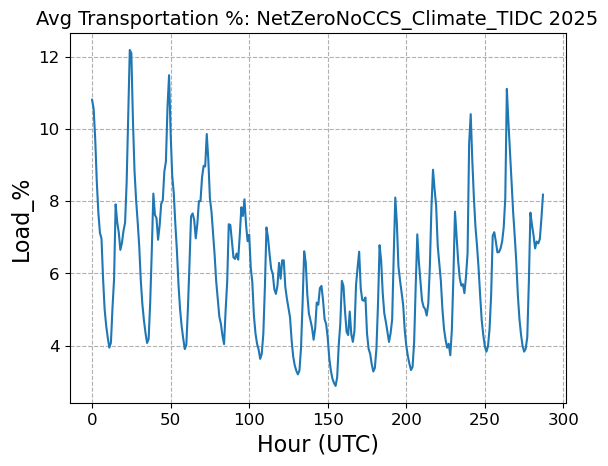

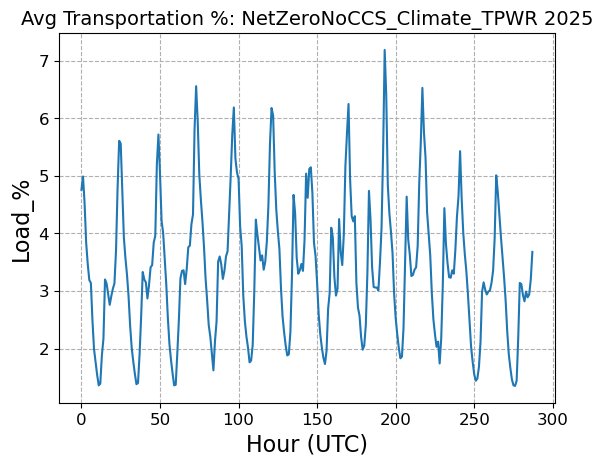

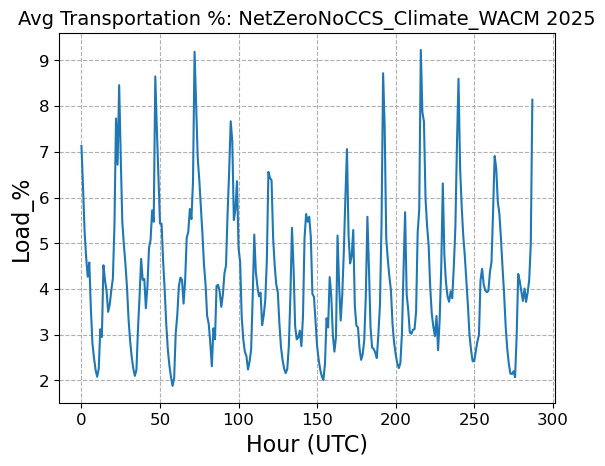

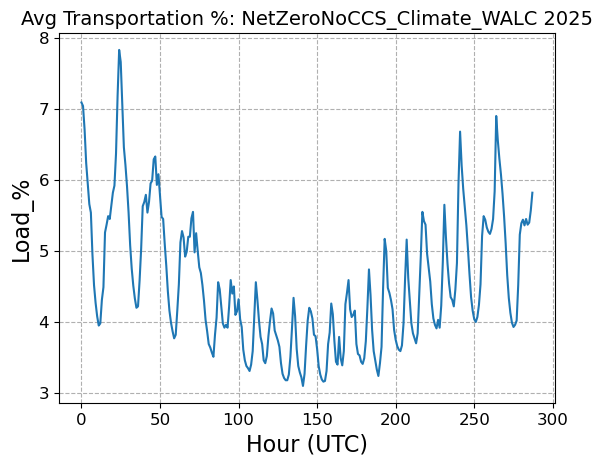

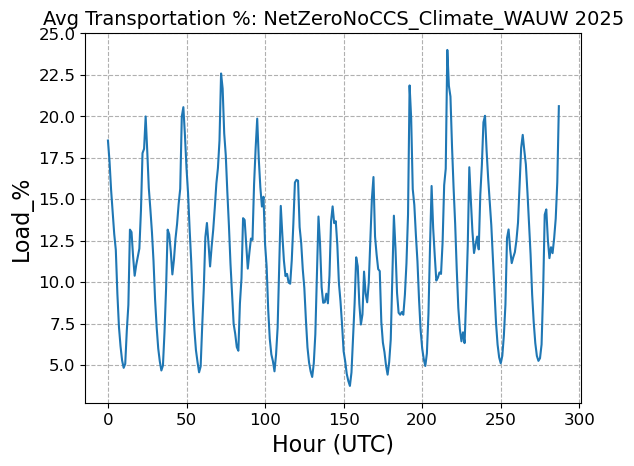

Using an array to plot every BA total load data


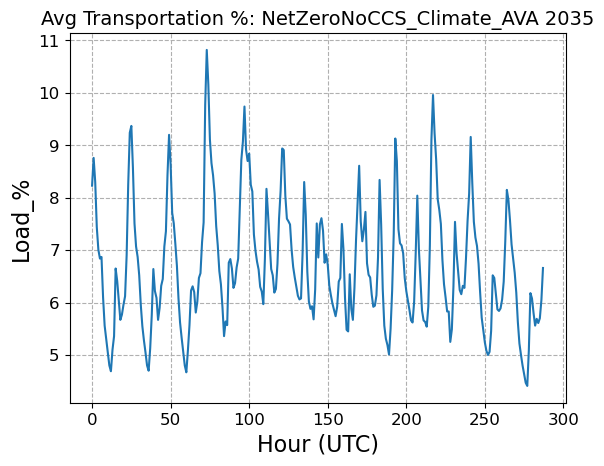

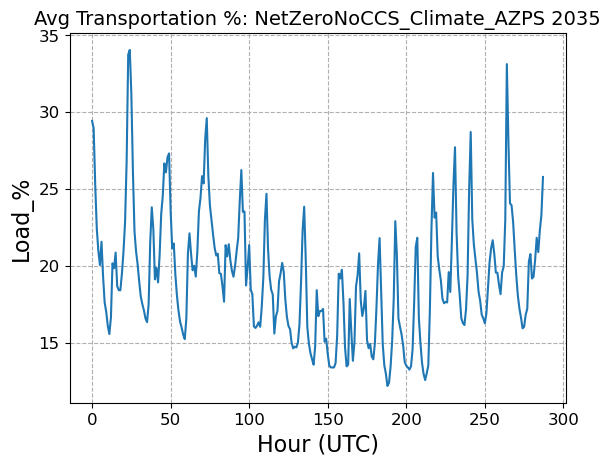

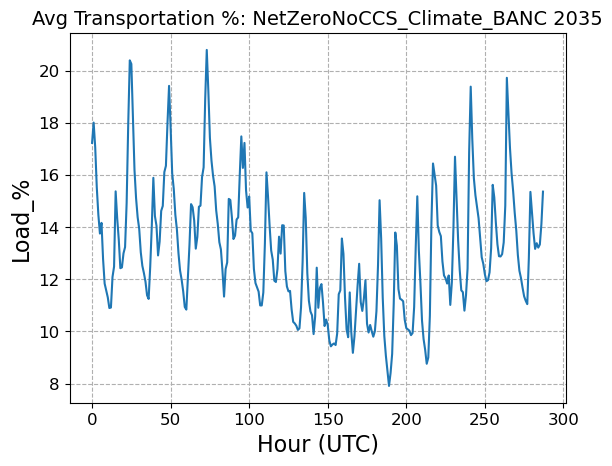

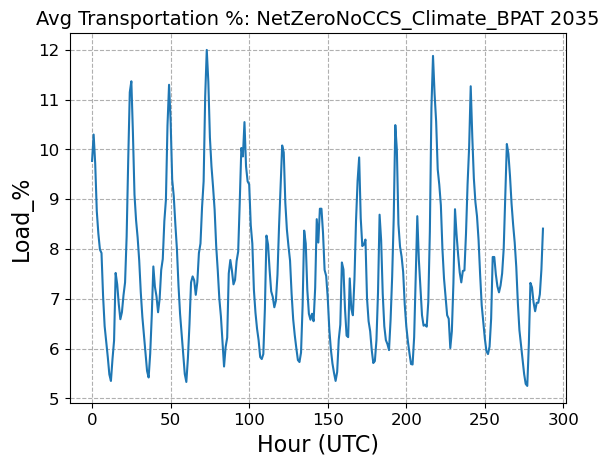

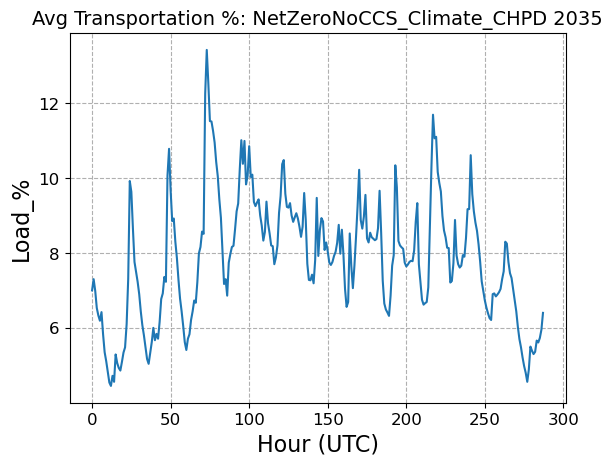

...

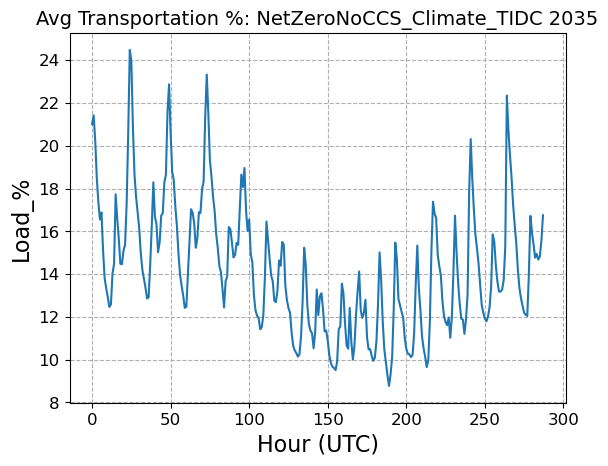

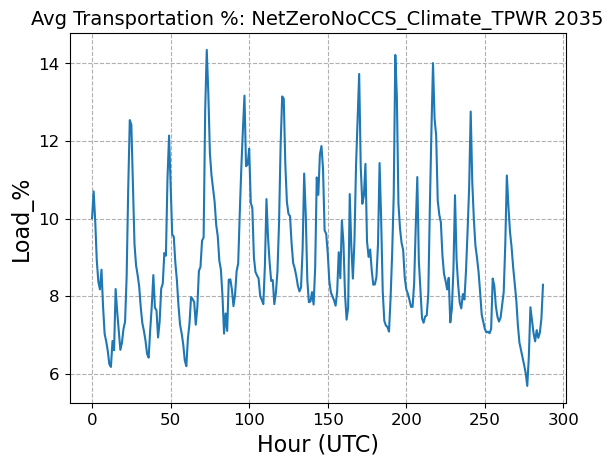

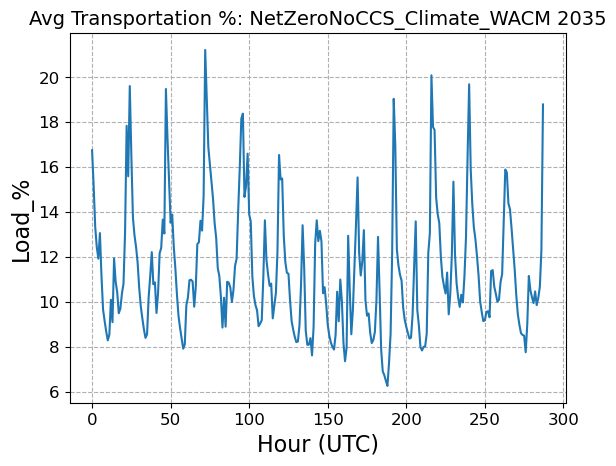

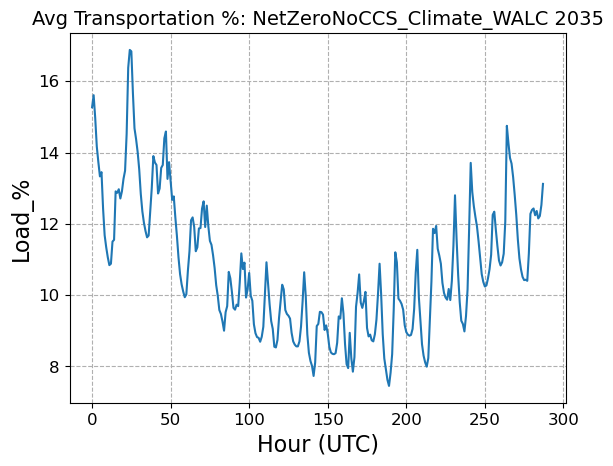

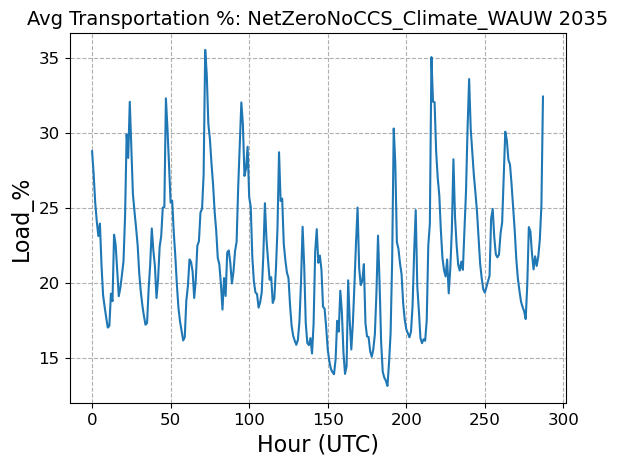

Using an array to plot every BA total load data


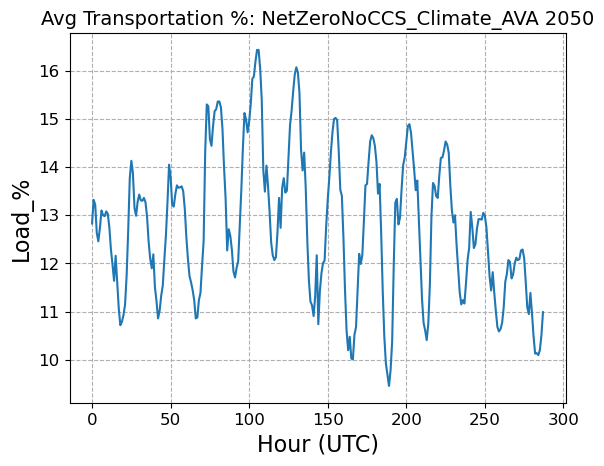

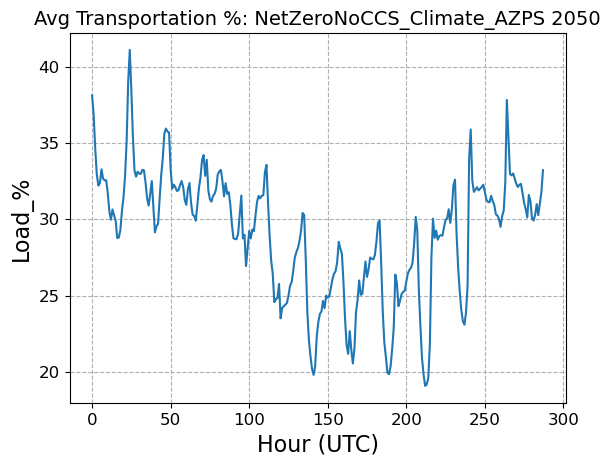

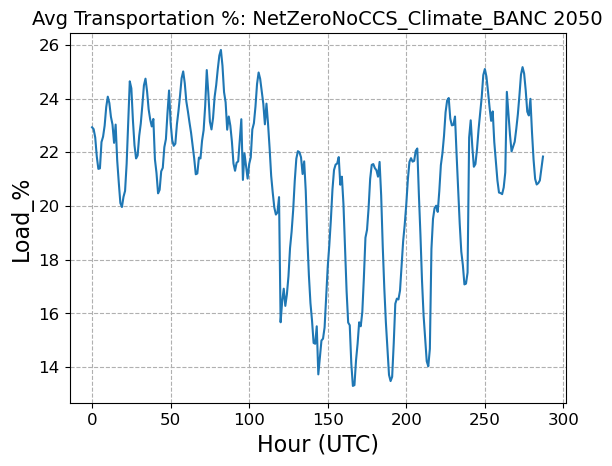

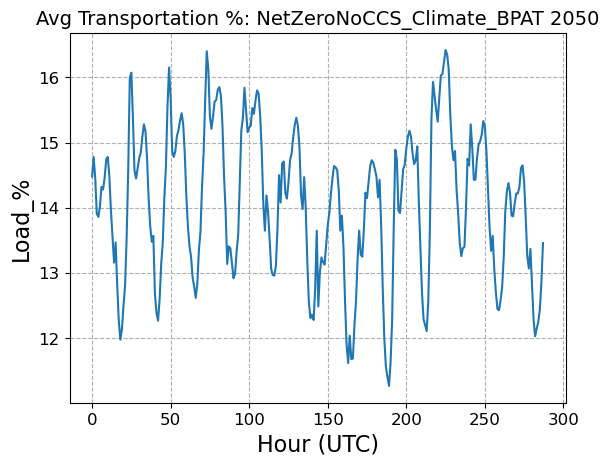

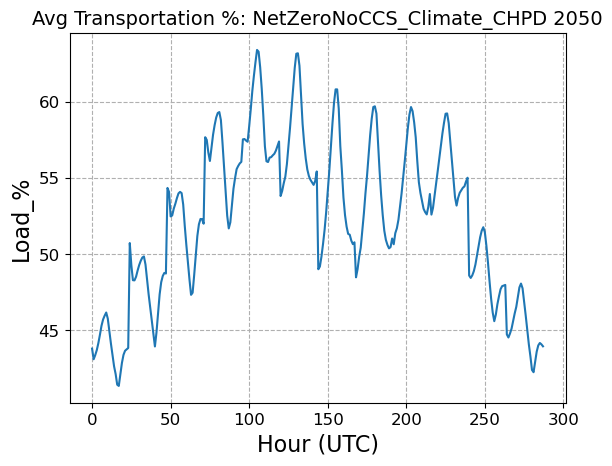

...

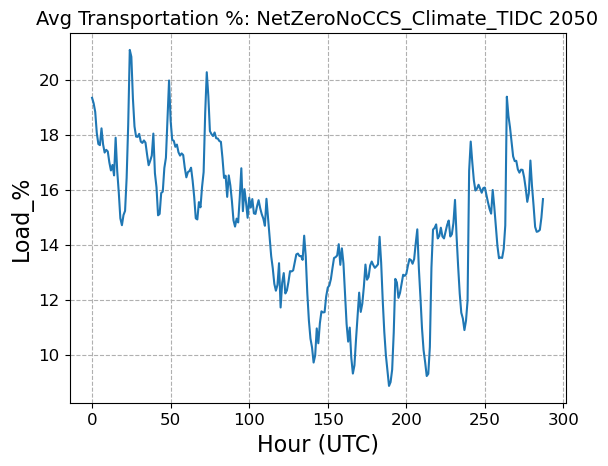

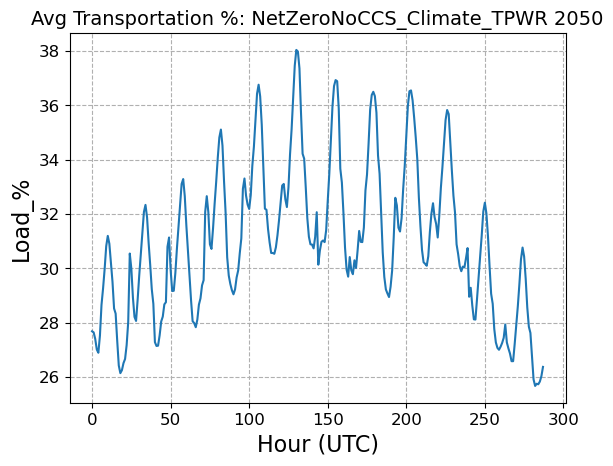

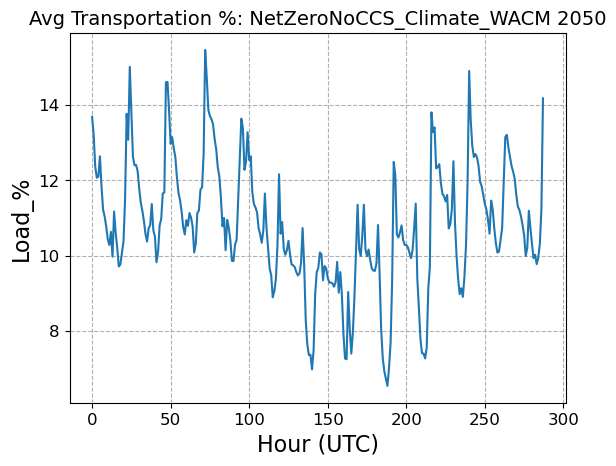

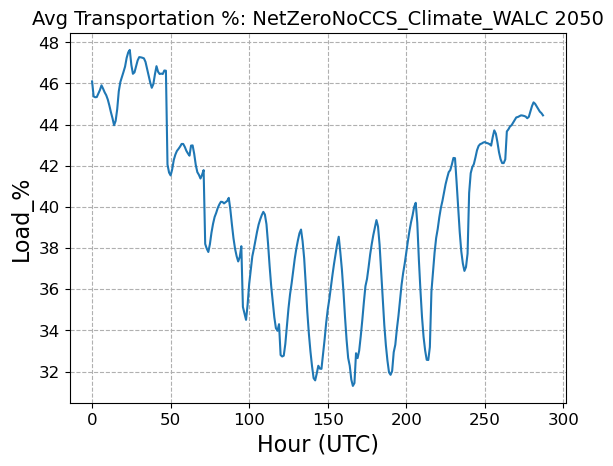

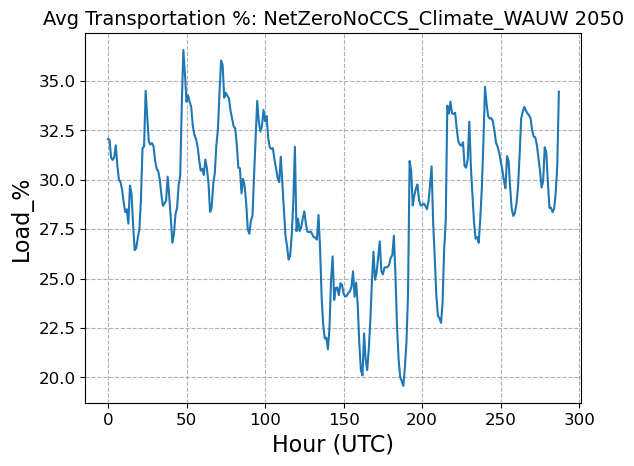

In [9]:
# Plot from Task data
import pandas as pd
import numpy as np
import os # if I have time
import matplotlib.pyplot as plt

# running multiple files from a folder path
folder = 'Task 3.7/'
GCAM = ['BAU_Climate_', 'NetZeroNoCCS_Climate_']
years = ['2025', '2035', '2050']
task = '_3.7'

for path in GCAM:
    for year in years:
        file = pd.read_csv(folder + path + year + task + '_data.csv')
        BA_LIST = ['AVA', 'AZPS', 'BANC', 'BPAT', 'CHPD', 'CISO', 'DOPD', 'EPE', 'GCPD', 'IID', 'IPCO', 'LDWP', 'NEVP', 'NWMT', 
                   'PACE', 'PACW', 'PGE', 'PNM', 'PSCO', 'PSEI', 'SCL', 'SRP', 'TEPC', 'TIDC', 'TPWR', 'WACM', 'WALC', 'WAUW']
        print("Using an array to plot every BA total load data")  
        
        for ba in BA_LIST:
            badata = file.loc[file['BA'] == ba]
            monthly = badata
            #monthly = badata.loc[badata['Month'] == y]
            fig = plt.figure()
            plt.xticks()
            plt.plot(monthly['Hour'], monthly['Transportation_Load_Penetration_Percentage'], label='Transportation_Load_MWh_Ratio')
            plt.ylabel('Load_%', fontsize=16)
            plt.xlabel('Hour (UTC)', fontsize=16)
            plt.title('Avg Transportation %: ' + path + ba + ' ' + year, fontsize=14)
            plt.grid(axis='both', linestyle='--')
            plt.yticks(fontsize=12)
            plt.xticks(fontsize=12)
            plt.savefig(path + ba + '_' + year + '_month_' + '.png')
            plt.show() 